Load Data

In [1]:
import os
from pathlib import Path

file_path = Path('/data/soom/LSRW/eval/Huawei')
img_labels = sorted(os.listdir(file_path / 'low'))

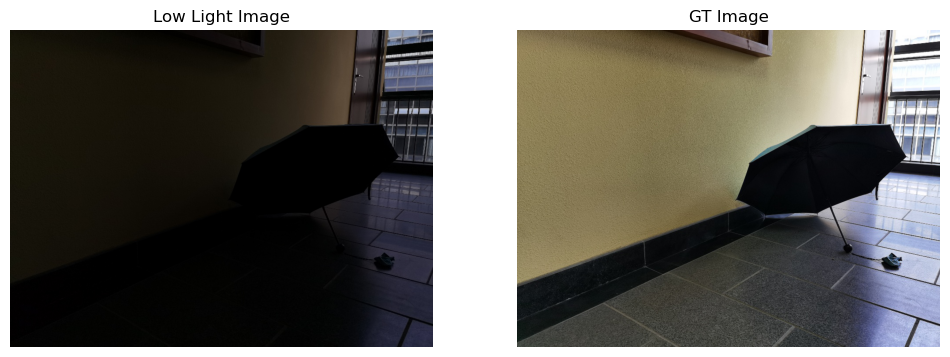

In [2]:
from PIL import Image
import matplotlib.pyplot as plt

lq_img = Image.open(file_path / 'low' / img_labels[0])
hq_img = Image.open(file_path / 'high' / img_labels[0])

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Display low quality image
axes[0].imshow(lq_img)
axes[0].set_title('Low Light Image')
axes[0].axis('off')

# Display high quality image
axes[1].imshow(hq_img)
axes[1].set_title('GT Image')
axes[1].axis('off')

plt.show()

Load Model

In [3]:
import numpy as np
import torch
from network.conv_node import NODE
from misc import *

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = NODE(device, (3, 256, 256), 32, augment_dim=0, time_dependent=True, adjoint=True)
model.eval()
model.to(device)
model.load_state_dict(torch.load(f'pth/universal.pth', weights_only=True), strict=False)

_IncompatibleKeys(missing_keys=[], unexpected_keys=['odefunc.norm.weight', 'odefunc.norm.bias', 'odefunc.condition.conv.0.weight', 'odefunc.condition.conv.0.bias', 'odefunc.condition.conv.2.weight', 'odefunc.condition.conv.2.bias', 'odefunc.condition.conv.4.weight', 'odefunc.condition.conv.4.bias', 'odefunc.cond_brightness.0.weight', 'odefunc.cond_brightness.2.weight', 'odeblock.odefunc.norm.weight', 'odeblock.odefunc.norm.bias', 'odeblock.odefunc.condition.conv.0.weight', 'odeblock.odefunc.condition.conv.0.bias', 'odeblock.odefunc.condition.conv.2.weight', 'odeblock.odefunc.condition.conv.2.bias', 'odeblock.odefunc.condition.conv.4.weight', 'odeblock.odefunc.condition.conv.4.bias', 'odeblock.odefunc.cond_brightness.0.weight', 'odeblock.odefunc.cond_brightness.2.weight'])

Calculate Clip Scores (vs T  = exposure level), on one image
- prompt: predefined by [torchmetrics library](https://lightning.ai/docs/torchmetrics/stable/multimodal/clip_iqa.html)
    - quality: "Good photo" vs. "Bad photo"
    - brightness: "Bright photo" vs. "Dark photo"

In [4]:

from tqdm import tqdm
from torchmetrics.multimodal import CLIPImageQualityAssessment

def image_tensor(image_path, size=None):
    img = Image.open(image_path)
    
    if size != None:
        img = img.resize(size)

    img = (np.asarray(img)/255.0)
    img = torch.from_numpy(img).float()
    img = img.permute(2,0,1).unsqueeze(0)
    return img

lq_img = image_tensor(file_path / 'low' / img_labels[0], (256, 256)).to(device)
hq_img = image_tensor(file_path / 'high' / img_labels[0], (256, 256)).to(device)

psnr_results, ssim_results, clip_scores, clip_av_scores = [], [], [], []
T_values = np.linspace(0.1, 10, 100)  # Adjust T value

clip_iqa = CLIPImageQualityAssessment(prompts=("quality", "brightness")).to(device)

def calculate_clip_score(pred):
    score = clip_iqa(pred.unsqueeze(0))
    score_np = score['quality'].item()
    score_np_av = (score_np + score['brightness'].item()) / 2
    return score_np, score_np_av

for T in tqdm(T_values):
    with torch.no_grad():
        integration_time = torch.tensor([0, T]).float().cuda()
        pred = model(lq_img, integration_time, inference=True)['output'][0]
        psnr_results.append(calculate_psnr(pred, hq_img).item())
        ssim_results.append(calculate_ssim(pred, hq_img).item())
        clip_score, clip_score_av = calculate_clip_score(pred)
        clip_scores.append(clip_score)
        clip_av_scores.append(clip_score_av)


100%|██████████| 100/100 [01:44<00:00,  1.04s/it]


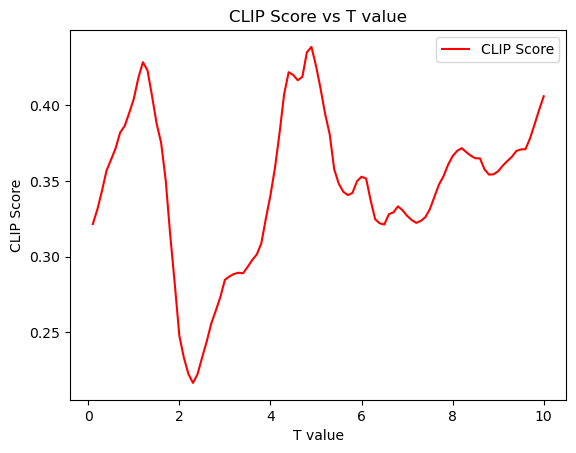

In [5]:
plt.plot(T_values, clip_scores, label='CLIP Score', color='red')

plt.xlabel('T value')
plt.ylabel('CLIP Score')
plt.title('CLIP Score vs T value')
plt.legend()
plt.show()

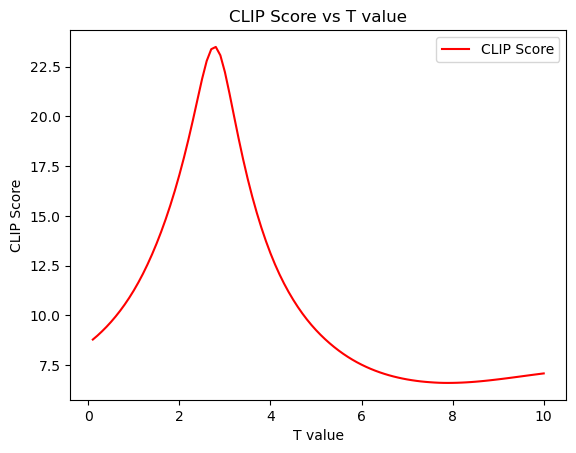

In [6]:
plt.plot(T_values, psnr_results, label='CLIP Score', color='red')

plt.xlabel('T value')
plt.ylabel('CLIP Score')
plt.title('CLIP Score vs T value')
plt.legend()
plt.show()

6it [00:05,  1.20it/s]


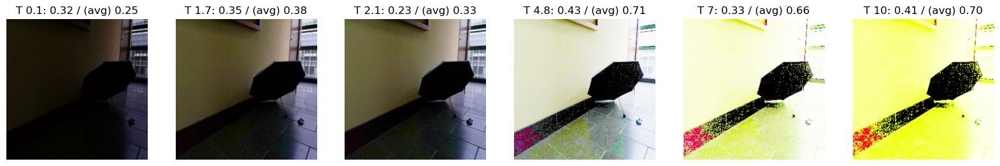

In [9]:
from torchvision.transforms.functional import to_pil_image

visualize_T_vals = [0.1, 1.7, 2.1, 4.8, 7, 10]
fig = plt.figure(figsize=(20, 10))
for i, T in tqdm(enumerate(visualize_T_vals)):
    with torch.no_grad():
        integration_time = torch.tensor([0, T]).float().cuda()
        pred = model(lq_img, integration_time, inference=True)['output'][0]
        clip_score, clip_score_av = calculate_clip_score(pred)
        pred_img = to_pil_image(pred.cpu())
        ax = plt.subplot(1, len(visualize_T_vals), i+1)
        plt.imshow(pred_img)
        plt.title(f'T {T}: {clip_score:.2f} / (avg) {clip_score_av:.2f}')
        plt.axis('off')
plt.show()

Prompt Adjustment w/ custom prompts

In [10]:
def visualize_clip_score(T_vals, prompts):
    clip_iqa = CLIPImageQualityAssessment(prompts=prompts).to(device)

    fig = plt.figure(figsize=(20, 10))
    for i, T in tqdm(enumerate(T_vals)):
        with torch.no_grad():
            integration_time = torch.tensor([0, T]).float().cuda()
            pred = model(lq_img, integration_time, inference=True)['output'][0]
            score = clip_iqa(pred.unsqueeze(0))
            print(score)
            # clip_score = score[prompts[0]].item()
            # pred_img = to_pil_image(pred.cpu())
            # ax = plt.subplot(1, len(visualize_T_vals), i+1)
            # plt.imshow(pred_img)
            # plt.title(f'T {T}: {clip_score:.2f}')
            # plt.axis('off')
    # plt.show()

visualize_T_vals = [0.1, 1.7, 2.1, 4.8, 7, 10]
visualize_clip_score(visualize_T_vals, (('well-exposed', 'too dark or bright'), 'quality', 'brightness'))

1it [00:00,  3.71it/s]

{'user_defined_0': tensor(0.1650, device='cuda:0'), 'quality': tensor(0.3215, device='cuda:0'), 'brightness': tensor(0.1818, device='cuda:0')}


2it [00:00,  2.63it/s]

{'user_defined_0': tensor(0.3217, device='cuda:0'), 'quality': tensor(0.3504, device='cuda:0'), 'brightness': tensor(0.4022, device='cuda:0')}


3it [00:01,  2.41it/s]

{'user_defined_0': tensor(0.3109, device='cuda:0'), 'quality': tensor(0.2332, device='cuda:0'), 'brightness': tensor(0.4357, device='cuda:0')}


4it [00:02,  1.49it/s]

{'user_defined_0': tensor(0.5798, device='cuda:0'), 'quality': tensor(0.4349, device='cuda:0'), 'brightness': tensor(0.9793, device='cuda:0')}


5it [00:03,  1.13it/s]

{'user_defined_0': tensor(0.3168, device='cuda:0'), 'quality': tensor(0.3270, device='cuda:0'), 'brightness': tensor(0.9902, device='cuda:0')}


6it [00:05,  1.18it/s]

{'user_defined_0': tensor(0.1616, device='cuda:0'), 'quality': tensor(0.4059, device='cuda:0'), 'brightness': tensor(0.9940, device='cuda:0')}


<Figure size 2000x1000 with 0 Axes>

In [11]:
visualize_clip_score(visualize_T_vals, (('well-exposed', 'too dark or bright'), ('well-exposed', 'too dark or too bright'), ('balanced exposure', 'too dark or bright'), 'quality'))

1it [00:00,  3.91it/s]

{'user_defined_0': tensor(0.1650, device='cuda:0'), 'user_defined_1': tensor(0.1426, device='cuda:0'), 'user_defined_2': tensor(0.2175, device='cuda:0'), 'quality': tensor(0.3215, device='cuda:0')}


2it [00:00,  2.73it/s]

{'user_defined_0': tensor(0.3217, device='cuda:0'), 'user_defined_1': tensor(0.3711, device='cuda:0'), 'user_defined_2': tensor(0.5560, device='cuda:0'), 'quality': tensor(0.3504, device='cuda:0')}


3it [00:01,  2.48it/s]

{'user_defined_0': tensor(0.3109, device='cuda:0'), 'user_defined_1': tensor(0.3765, device='cuda:0'), 'user_defined_2': tensor(0.4789, device='cuda:0'), 'quality': tensor(0.2332, device='cuda:0')}


4it [00:02,  1.53it/s]

{'user_defined_0': tensor(0.5798, device='cuda:0'), 'user_defined_1': tensor(0.6730, device='cuda:0'), 'user_defined_2': tensor(0.4663, device='cuda:0'), 'quality': tensor(0.4349, device='cuda:0')}


5it [00:03,  1.16it/s]

{'user_defined_0': tensor(0.3168, device='cuda:0'), 'user_defined_1': tensor(0.3797, device='cuda:0'), 'user_defined_2': tensor(0.0344, device='cuda:0'), 'quality': tensor(0.3270, device='cuda:0')}


6it [00:04,  1.21it/s]

{'user_defined_0': tensor(0.1616, device='cuda:0'), 'user_defined_1': tensor(0.1687, device='cuda:0'), 'user_defined_2': tensor(0.0076, device='cuda:0'), 'quality': tensor(0.4059, device='cuda:0')}


<Figure size 2000x1000 with 0 Axes>

In [12]:
visualize_clip_score(visualize_T_vals, (('balanced exposure', 'too dark or noisy'), ('balanced exposure', 'dark or noisy')))

1it [00:00,  3.66it/s]

{'user_defined_0': tensor(0.2290, device='cuda:0'), 'user_defined_1': tensor(0.2651, device='cuda:0')}


2it [00:00,  2.62it/s]

{'user_defined_0': tensor(0.3075, device='cuda:0'), 'user_defined_1': tensor(0.2256, device='cuda:0')}


3it [00:01,  2.40it/s]

{'user_defined_0': tensor(0.2320, device='cuda:0'), 'user_defined_1': tensor(0.1529, device='cuda:0')}


4it [00:02,  1.49it/s]

{'user_defined_0': tensor(0.1334, device='cuda:0'), 'user_defined_1': tensor(0.0844, device='cuda:0')}


5it [00:03,  1.13it/s]

{'user_defined_0': tensor(0.0138, device='cuda:0'), 'user_defined_1': tensor(0.0160, device='cuda:0')}


6it [00:05,  1.18it/s]

{'user_defined_0': tensor(0.0046, device='cuda:0'), 'user_defined_1': tensor(0.0063, device='cuda:0')}


<Figure size 2000x1000 with 0 Axes>

Prompt (pair) candidates
- "balanced exposure" vs. "too dark or bright"
- "balanced exposure" vs. "too dark or noisy" 

100%|██████████| 100/100 [01:36<00:00,  1.04it/s]


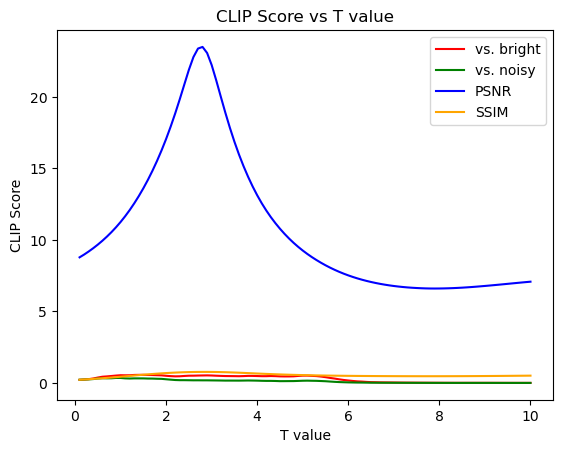

In [13]:
prompts = (('balanced exposure', 'too dark or bright'), ('balanced exposure', 'too dark or noisy'))
clip_iqa = CLIPImageQualityAssessment(prompts=prompts).to(device)

clip_scores_1, clip_scores_2 = [], []

for T in tqdm(T_values):
    with torch.no_grad():
        integration_time = torch.tensor([0, T]).float().cuda()
        pred = model(lq_img, integration_time, inference=True)['output'][0]
        score = clip_iqa(pred.unsqueeze(0))
        clip_scores_1.append(score['user_defined_0'].item())
        clip_scores_2.append(score['user_defined_1'].item())

plt.title('CLIP Score vs T value')
plt.xlabel('T value')
plt.ylabel('CLIP Score')
plt.plot(T_values, clip_scores_1, label='vs. bright', color='red')
plt.plot(T_values, clip_scores_2, label='vs. noisy', color='green')
plt.plot(T_values, psnr_results, label='PSNR', color='blue')
plt.plot(T_values, ssim_results, label='SSIM', color='orange')
plt.legend()
plt.show()

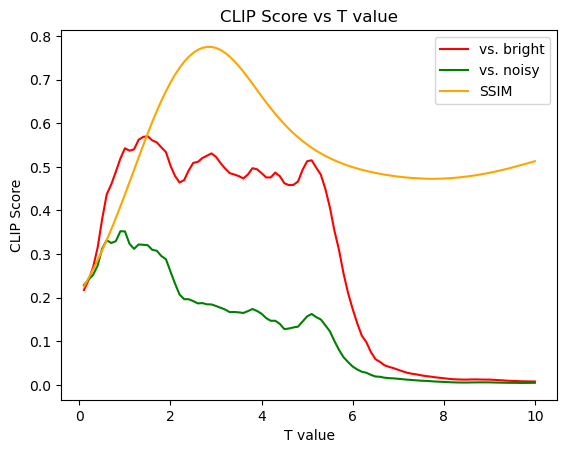

In [14]:
plt.title('CLIP Score vs T value')
plt.xlabel('T value')
plt.ylabel('CLIP Score')
plt.plot(T_values, clip_scores_1, label='vs. bright', color='red')
plt.plot(T_values, clip_scores_2, label='vs. noisy', color='green')
plt.plot(T_values, ssim_results, label='SSIM', color='orange')
plt.legend()
plt.show()

Try with 2nd image

100it [01:23,  1.20it/s]


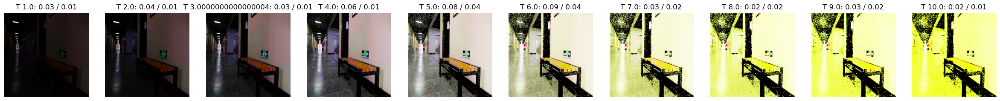

In [ ]:
lq_img = image_tensor(file_path / 'low' / img_labels[1], (256, 256)).to(device)
hq_img = image_tensor(file_path / 'high' / img_labels[1], (256, 256)).to(device)

clip_scores_1, clip_scores_2 = [], []

fig = plt.figure(figsize=(30, 10))
for idx, T in tqdm(enumerate(T_values)):
    with torch.no_grad():
        integration_time = torch.tensor([0, T]).float().cuda()
        pred = model(lq_img, integration_time, inference=True)['output'][0]
        score = clip_iqa(pred.unsqueeze(0))
        clip_scores_1.append(score['user_defined_0'].item())
        clip_scores_2.append(score['user_defined_1'].item())
        pred_img = to_pil_image(pred.cpu())
        if (idx+1) % 10 == 0:
            ax = plt.subplot(1, 10, (idx+1) // 10)
            plt.imshow(pred_img)
            plt.title(f'T {T:.1f}: {clip_scores_1[-1]:.2f} / {clip_scores_2[-1]:.2f}')
            plt.axis('off')

plt.show()

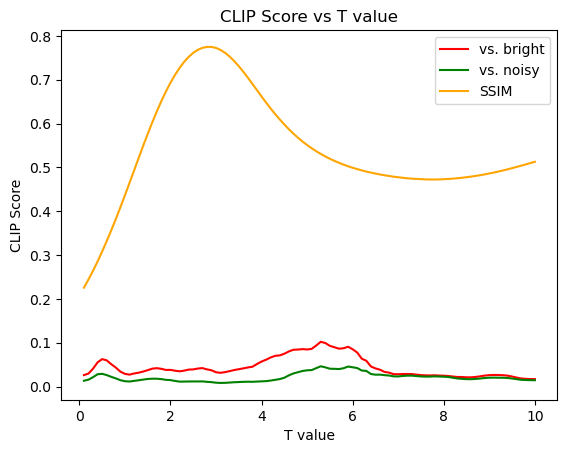

In [17]:
plt.title('CLIP Score vs T value')
plt.xlabel('T value')
plt.ylabel('CLIP Score')
plt.plot(T_values, clip_scores_1, label='vs. bright', color='red')
plt.plot(T_values, clip_scores_2, label='vs. noisy', color='green')
plt.plot(T_values, ssim_results, label='SSIM', color='orange')
plt.legend()
plt.show()

100it [01:03,  1.58it/s]


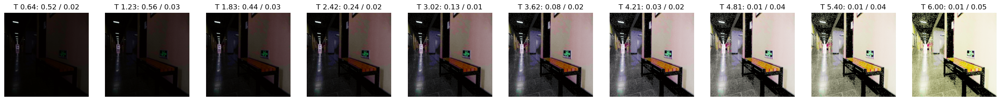

In [25]:
prompts = (('balanced exposure', 'overexposed or underexposed'), ('balanced exposure', 'noisy or underexposed'))
clip_iqa = CLIPImageQualityAssessment(prompts=prompts).to(device)

ssim_results, clip_scores_1, clip_scores_2 = [], [], []

adjusted_t_values = np.linspace(0.1, 6, 100)
fig = plt.figure(figsize=(30, 10))
for idx, T in tqdm(enumerate(adjusted_t_values)):
    with torch.no_grad():
        integration_time = torch.tensor([0, T]).float().cuda()
        pred = model(lq_img, integration_time, inference=True)['output'][0]
        score = clip_iqa(pred.unsqueeze(0))
        clip_scores_1.append(score['user_defined_0'].item())
        clip_scores_2.append(score['user_defined_1'].item())
        ssim_results.append(calculate_ssim(pred, hq_img).item())
        pred_img = to_pil_image(pred.cpu())
        if (idx+1) % 10 == 0:
            ax = plt.subplot(1, 10, (idx+1) // 10)
            plt.imshow(pred_img)
            plt.title(f'T {T:.2f}: {clip_scores_1[-1]:.2f} / {clip_scores_2[-1]:.2f}')
            plt.axis('off')

plt.show()

100it [00:57,  1.73it/s]


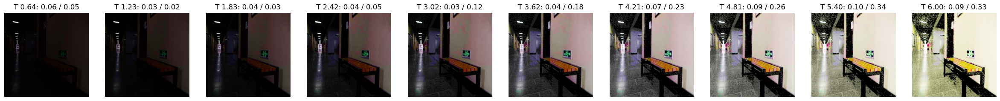

In [26]:
prompts = (('balanced exposure', 'too dark or bright'), ('natural exposure with clear details', 'too dark or bright'))
clip_iqa = CLIPImageQualityAssessment(prompts=prompts).to(device)

clip_scores_1, clip_scores_2 = [], []

adjusted_t_values = np.linspace(0.1, 6, 100)
fig = plt.figure(figsize=(30, 10))
for idx, T in tqdm(enumerate(adjusted_t_values)):
    with torch.no_grad():
        integration_time = torch.tensor([0, T]).float().cuda()
        pred = model(lq_img, integration_time, inference=True)['output'][0]
        score = clip_iqa(pred.unsqueeze(0))
        clip_scores_1.append(score['user_defined_0'].item())
        clip_scores_2.append(score['user_defined_1'].item())
        pred_img = to_pil_image(pred.cpu())
        if (idx+1) % 10 == 0:
            ax = plt.subplot(1, 10, (idx+1) // 10)
            plt.imshow(pred_img)
            plt.title(f'T {T:.2f}: {clip_scores_1[-1]:.2f} / {clip_scores_2[-1]:.2f}')
            plt.axis('off')

plt.show()

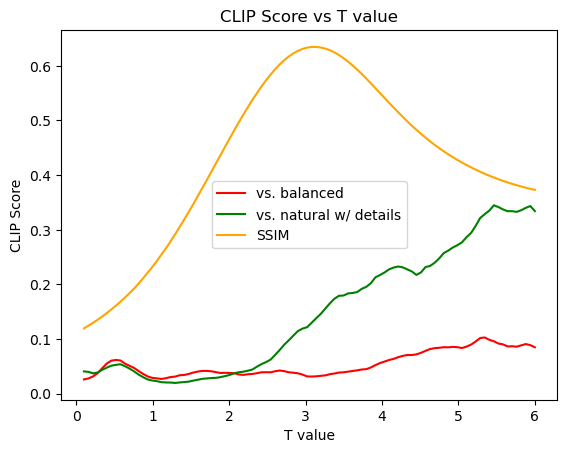

In [28]:
plt.title('CLIP Score vs T value')
plt.xlabel('T value')
plt.ylabel('CLIP Score')
plt.plot(adjusted_t_values, clip_scores_1, label='vs. balanced', color='red')
plt.plot(adjusted_t_values, clip_scores_2, label='vs. natural w/ details', color='green')
plt.plot(adjusted_t_values, ssim_results, label='SSIM', color='orange')
plt.legend()
plt.show()

단어 수가 조금이라도 많거나, 어려운 단어가 있으면 안되는 듯하다..

100it [00:58,  1.72it/s]


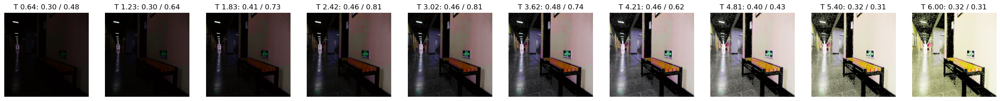

In [29]:
prompts = (('good exposure', 'bad exposure'), ('good exposure', 'under or over exposure'))
clip_iqa = CLIPImageQualityAssessment(prompts=prompts).to(device)

clip_scores_1, clip_scores_2 = [], []

adjusted_t_values = np.linspace(0.1, 6, 100)
fig = plt.figure(figsize=(30, 10))
for idx, T in tqdm(enumerate(adjusted_t_values)):
    with torch.no_grad():
        integration_time = torch.tensor([0, T]).float().cuda()
        pred = model(lq_img, integration_time, inference=True)['output'][0]
        score = clip_iqa(pred.unsqueeze(0))
        clip_scores_1.append(score['user_defined_0'].item())
        clip_scores_2.append(score['user_defined_1'].item())
        pred_img = to_pil_image(pred.cpu())
        if (idx+1) % 10 == 0:
            ax = plt.subplot(1, 10, (idx+1) // 10)
            plt.imshow(pred_img)
            plt.title(f'T {T:.2f}: {clip_scores_1[-1]:.2f} / {clip_scores_2[-1]:.2f}')
            plt.axis('off')

plt.show()

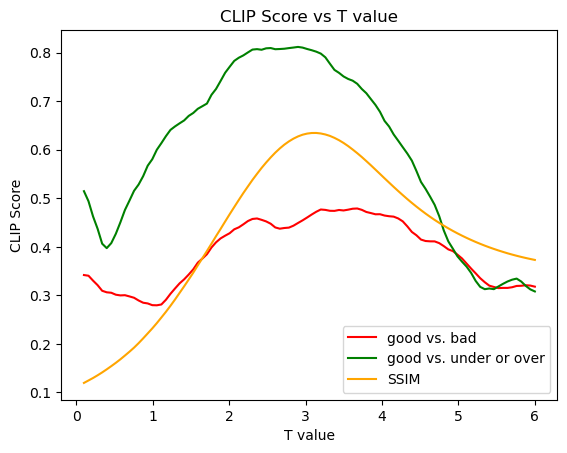

In [31]:
plt.title('CLIP Score vs T value')
plt.xlabel('T value')
plt.ylabel('CLIP Score')
plt.plot(adjusted_t_values, clip_scores_1, label='good vs. bad', color='red')
plt.plot(adjusted_t_values, clip_scores_2, label='good vs. under or over', color='green')
plt.plot(adjusted_t_values, ssim_results, label='SSIM', color='orange')
plt.legend()
plt.show()

Try with other images,, 10개?

100it [01:24,  1.18it/s]


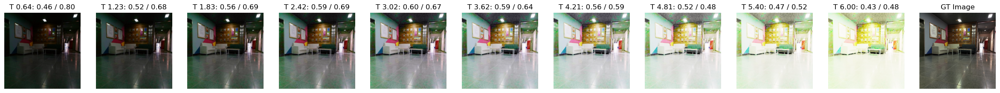

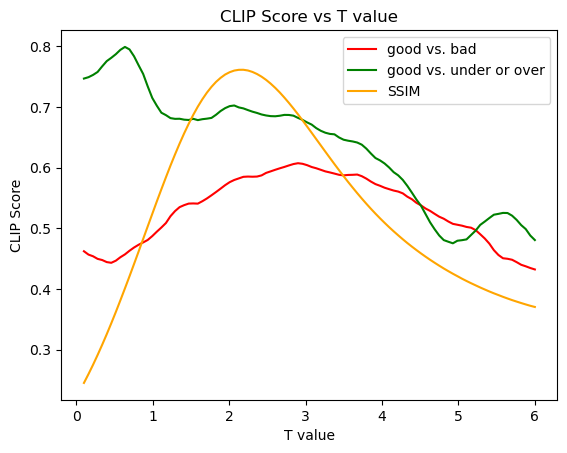

100it [02:03,  1.24s/it]


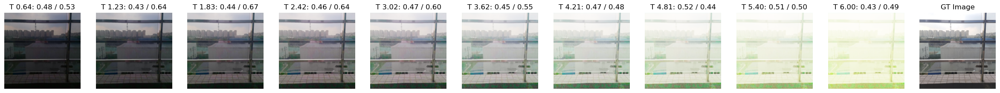

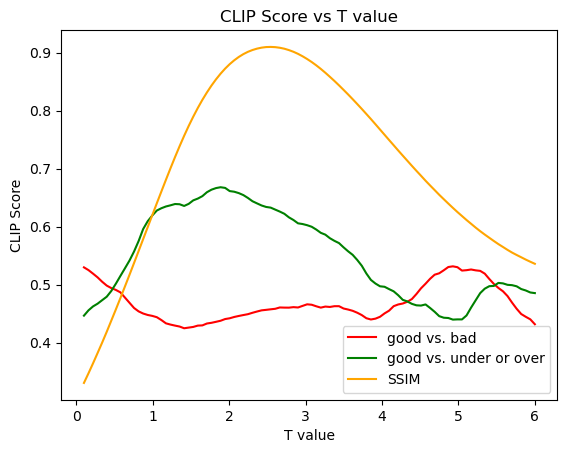

100it [00:59,  1.67it/s]


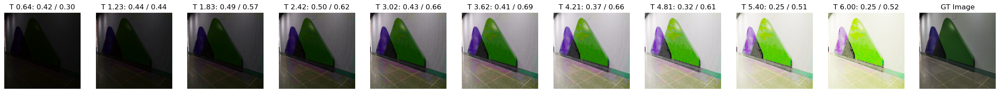

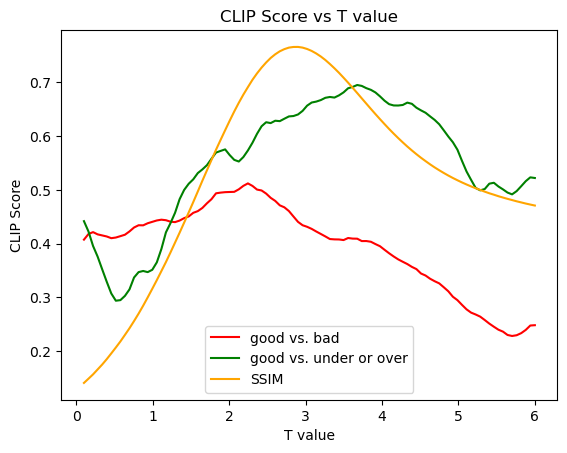

100it [01:01,  1.62it/s]


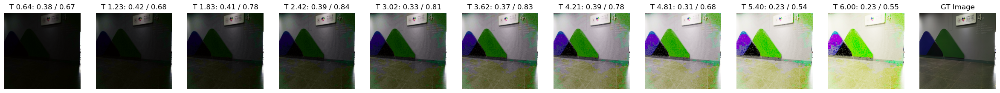

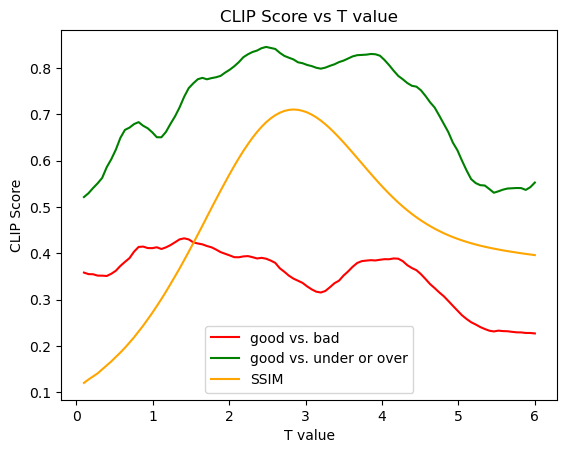

100it [01:02,  1.61it/s]


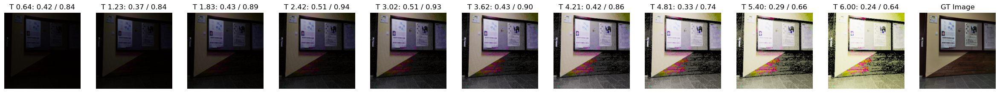

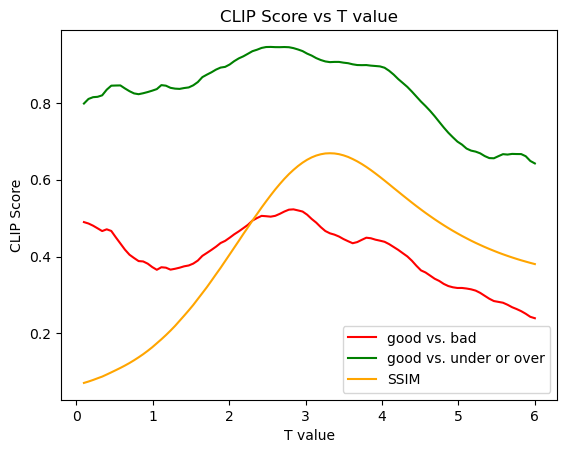

100it [01:06,  1.50it/s]


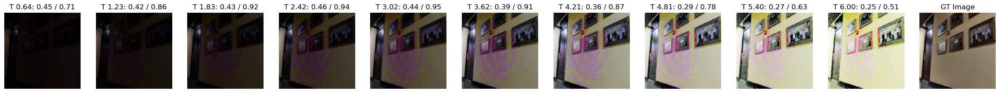

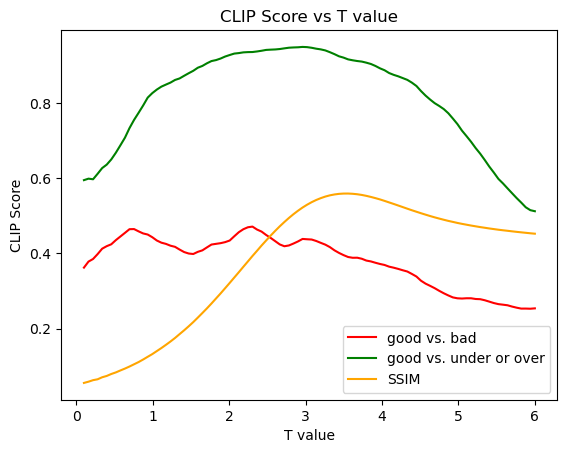

100it [01:38,  1.01it/s]


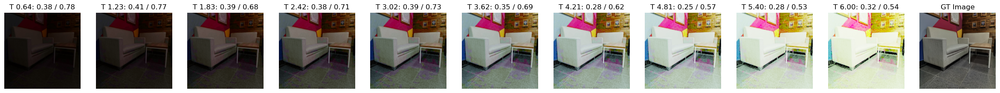

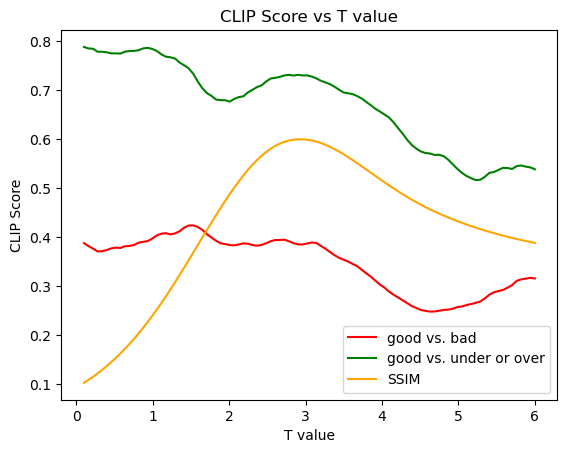

100it [01:02,  1.61it/s]


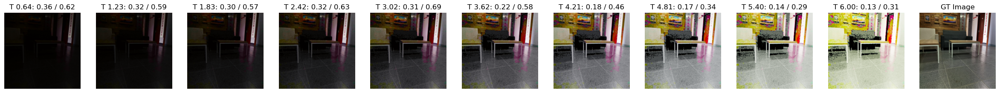

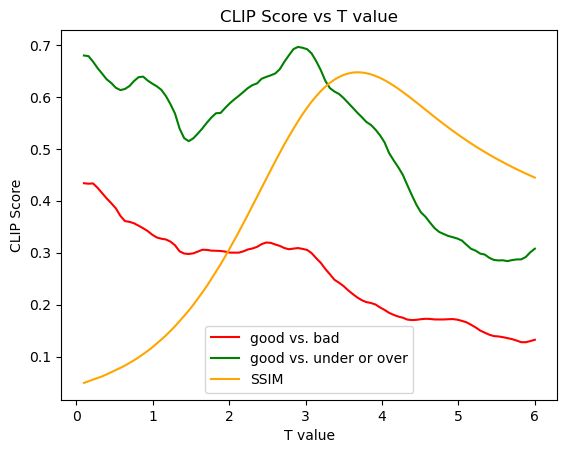

100it [01:10,  1.41it/s]


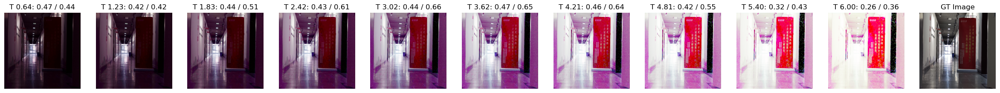

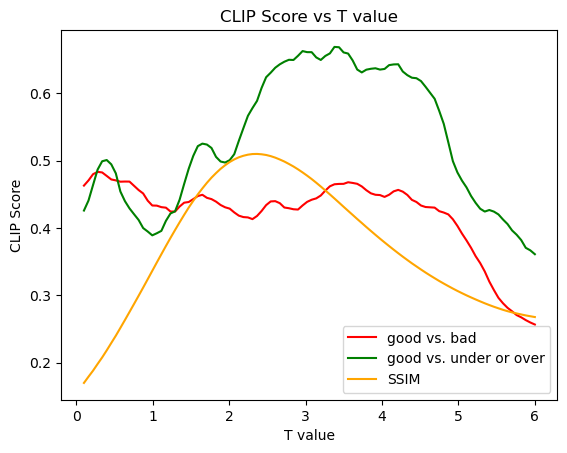

100it [01:44,  1.04s/it]


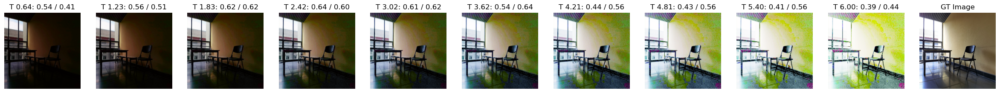

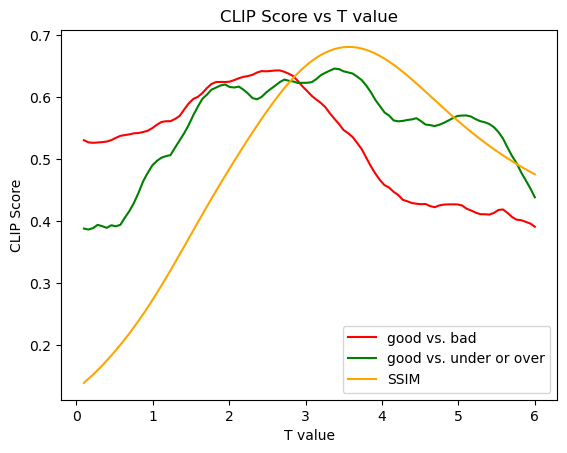

In [33]:
prompts = (('good exposure', 'bad exposure'), ('good exposure', 'under or over exposure'))
clip_iqa = CLIPImageQualityAssessment(prompts=prompts).to(device)

def visualize_alignment(lq_img, hq_img):
    ssim_results, clip_scores_1, clip_scores_2 = [], [], []

    adjusted_t_values = np.linspace(0.1, 6, 100)
    fig = plt.figure(figsize=(30, 10))
    for idx, T in tqdm(enumerate(adjusted_t_values)):
        with torch.no_grad():
            integration_time = torch.tensor([0, T]).float().cuda()
            pred = model(lq_img, integration_time, inference=True)['output'][0]
            score = clip_iqa(pred.unsqueeze(0))
            clip_scores_1.append(score['user_defined_0'].item())
            clip_scores_2.append(score['user_defined_1'].item())
            ssim_results.append(calculate_ssim(pred, hq_img).item())
            pred_img = to_pil_image(pred.cpu())
            if (idx+1) % 10 == 0:
                ax = plt.subplot(1, 11, (idx+1) // 10)
                plt.imshow(pred_img)
                plt.title(f'T {T:.2f}: {clip_scores_1[-1]:.2f} / {clip_scores_2[-1]:.2f}')
                plt.axis('off')

    ax = plt.subplot(1, 11, 11)
    plt.imshow(to_pil_image(hq_img.squeeze().cpu()))
    plt.title('GT Image')
    plt.axis('off')
    plt.show()

    plt.title('CLIP Score vs T value')
    plt.xlabel('T value')
    plt.ylabel('CLIP Score')
    plt.plot(adjusted_t_values, clip_scores_1, label='good vs. bad', color='red')
    plt.plot(adjusted_t_values, clip_scores_2, label='good vs. under or over', color='green')
    plt.plot(adjusted_t_values, ssim_results, label='SSIM', color='orange')
    plt.legend()
    plt.show()

for i in range(2, 12):
    lq_img = image_tensor(file_path / 'low' / img_labels[i], (256, 256)).to(device)
    hq_img = image_tensor(file_path / 'high' / img_labels[i], (256, 256)).to(device)
    visualize_alignment(lq_img, hq_img)

100it [01:16,  1.30it/s]


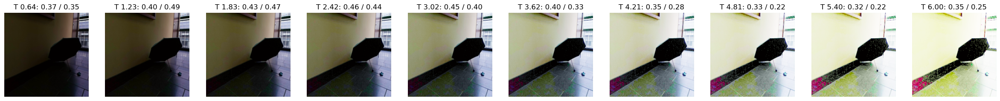

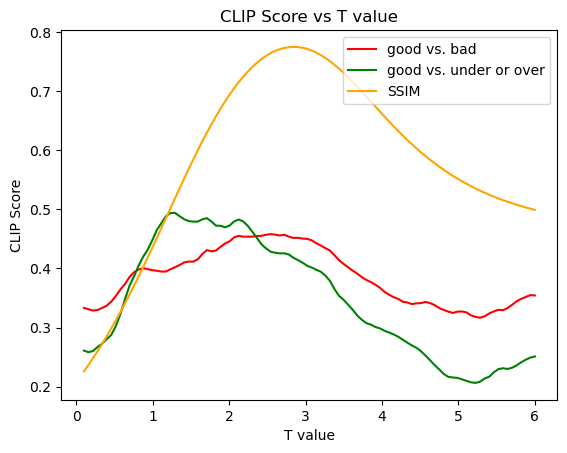

In [8]:
from torchvision.transforms.functional import to_pil_image

prompts = (('good exposure', 'bad exposure'), ('good exposure', 'under exposure'), ('good exposure', 'over exposure'))
clip_iqa = CLIPImageQualityAssessment(prompts=prompts).to(device)

ssim_results, clip_scores_1, clip_scores_2 = [], [], []

adjusted_t_values = np.linspace(0.1, 6, 100)
fig = plt.figure(figsize=(30, 10))
for idx, T in tqdm(enumerate(adjusted_t_values)):
    with torch.no_grad():
        integration_time = torch.tensor([0, T]).float().cuda()
        pred = model(lq_img, integration_time, inference=True)['output'][0]
        score = clip_iqa(pred.unsqueeze(0))
        clip_scores_1.append(score['user_defined_0'].item())
        clip_scores_2.append(min(score['user_defined_1'].item(), score['user_defined_2'].item()))
        ssim_results.append(calculate_ssim(pred, hq_img).item())
        pred_img = to_pil_image(pred.cpu())
        if (idx+1) % 10 == 0:
            ax = plt.subplot(1, 10, (idx+1) // 10)
            plt.imshow(pred_img)
            plt.title(f'T {T:.2f}: {clip_scores_1[-1]:.2f} / {clip_scores_2[-1]:.2f}')
            plt.axis('off')

plt.show()

plt.title('CLIP Score vs T value')
plt.xlabel('T value')
plt.ylabel('CLIP Score')
plt.plot(adjusted_t_values, clip_scores_1, label='good vs. bad', color='red')
plt.plot(adjusted_t_values, clip_scores_2, label='good vs. under or over', color='green')
plt.plot(adjusted_t_values, ssim_results, label='SSIM', color='orange')
plt.legend()
plt.show()

좀 더 시도해볼 만한 것들
- GT와의 perceptual loss (LPIPS)
- CLIP score + LPIPS 둘다 사용